In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import glob
import pickle
import Img_process_func as img_pro
%matplotlib inline

## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Camera calibration and distortion coefficients
As we know the real cameras use curved lenses to form an image, and light rays often bend a little too much or too little at the edges of these lenses. So first, I'll computer camera calibratin from calibration images. I store the coeffients in the *pickle_dict.p* for later use.

In [2]:
def calibrate(imgs_path):
    # object points
    objp = np.zeros((6*9, 3), dtype=np.float32)
    objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)
    # a list to restore object points and image points
    objpoints = []
    imgpoints = []
    corners_imgs = []
    # enumerate each image restore and find image points 
    for idx, fname in enumerate(imgs_path):
        img = cv2.imread(fname)
        # convert BGR image to Grayscale image
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # find Chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9, 6) , None)
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # draw corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            corners_imgs.append(img)
    
    # calibrate camera return calibrate coefficients
    n = np.random.randint(0,len(corners_imgs))
    plt.figure(figsize=(15,15))
    plt.imshow(corners_imgs[n])
    plt.title('Display corners', size=20)
    
    img_size = (corners_imgs[n].shape[1], corners_imgs[n].shape[0])
    retval, cameraMatrix, distCoeffs, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    pickle_dict = {}
    pickle_dict['mtx'] = cameraMatrix
    pickle_dict['dist'] = distCoeffs
    pickle.dump(pickle_dict, open('./camera_cal/dict_pickle.p','wb'))
    #return cameraMatrix, distCoeffs

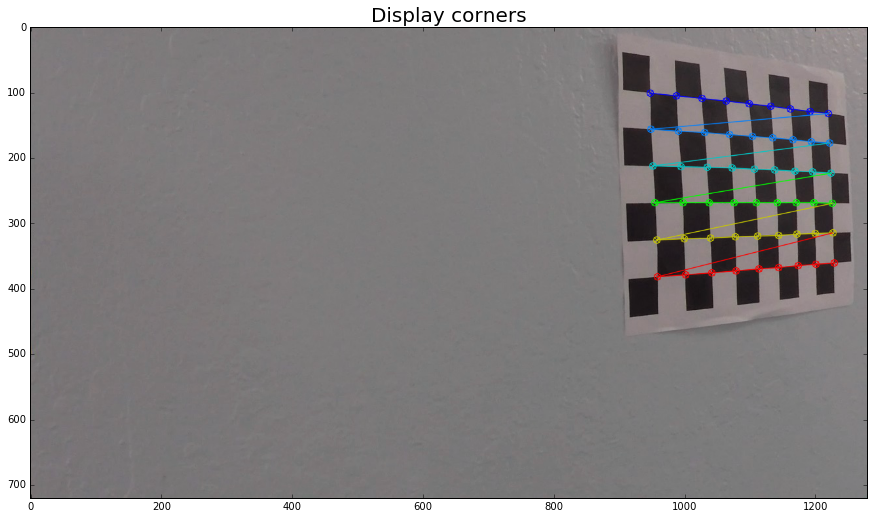

In [3]:
# The path of chessboard images
camera_cal_path = glob.glob('./camera_cal/*.jpg')
calibrate(camera_cal_path)

In [4]:
def undistorte_img(img):
    with open('./camera_cal/dict_pickle.p', mode='rb') as f:
        coefficient = pickle.load(f)
    mtx = coefficient['mtx']
    dist = coefficient['dist']
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

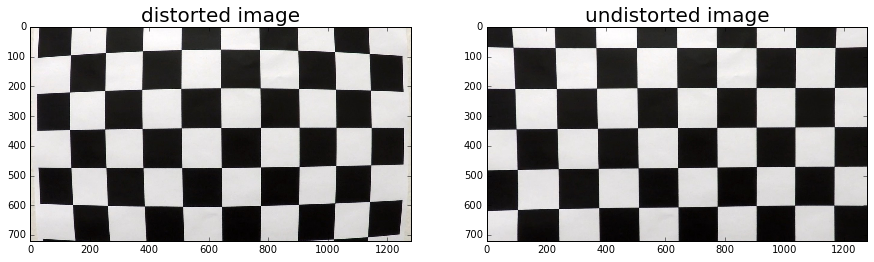

In [5]:
test_img = mpimg.imread('./camera_cal/calibration1.jpg')
test_udst_img = img_pro.undistorte_img(test_img)
fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(15,10))
axis[0].imshow(test_img)
axis[0].set_title('distorted image', size=20)
axis[1].imshow(test_udst_img)
axis[1].set_title('undistorted image', size=20)
plt.savefig('./output_images/undistored_output.png')

## Apply a distortion correction to raw images

In [6]:
def show_imgs(images, fig_name='test.png', cmap=None):
    nr = int(len(images)/2)
    indices = np.arange(0, len(images)).reshape(nr, 2)
    fig, axis = plt.subplots(nrows=nr, ncols=2, figsize=(15, 4*nr))
    fig.tight_layout()
    g = len(images[0].shape)
    for r in range(nr):
        for c in range(2):
            if  g > 2:
                axis[r][c].imshow(images[indices[r][c]])
            else:
                axis[r][c].imshow(images[indices[r][c]], cmap='gray')
    plt.savefig('./output_images/' + fig_name)

In [7]:
test_images_paths = glob.glob('./test_images/*.jpg')
test_images = [mpimg.imread(path) for path in test_images_paths]
# undistorted test imags
udst_imgs = [img_pro.undistorte_img(img) for img in test_images]

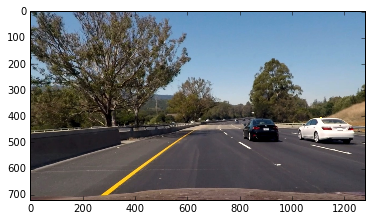

In [8]:
plt.imshow(udst_imgs[0])

In [9]:
compare_images = []
for i in range(len(test_images)):
    compare_images.append(test_images[i])
    compare_images.append(udst_imgs[i])
show_imgs(compare_images, fig_name='dist_udist_imgs.png')

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


## Use color transforms, grayscale etc. to detect a threshold binary image

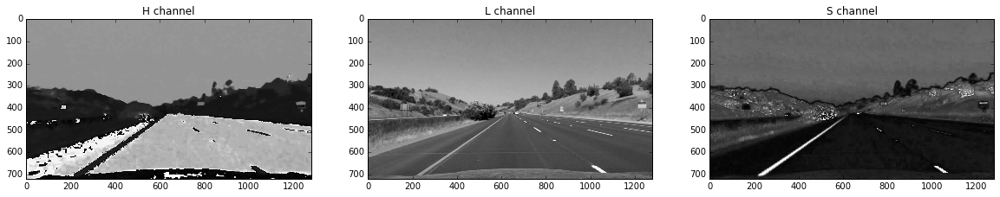

In [10]:
hls = cv2.cvtColor(udst_imgs[7], cv2.COLOR_RGB2HLS)
h_ch = hls[:,:,0]
l_ch = hls[:,:,1]
s_ch = hls[:,:,2]
fig, axis = plt.subplots(nrows=1, ncols=3, figsize=(20,5))
axis[0].imshow(h_ch, cmap='gray')
axis[0].set_title('H channel')
axis[1].imshow(l_ch, cmap='gray')
axis[1].set_title('L channel')
axis[2].imshow(s_ch, cmap='gray')
axis[2].set_title('S channel')
plt.savefig('./output_images/' + 'HLS_channel.png')

As seen above, lane lines are easy to identify in S channel. So I'm going to use S channel to deal with lane detection.

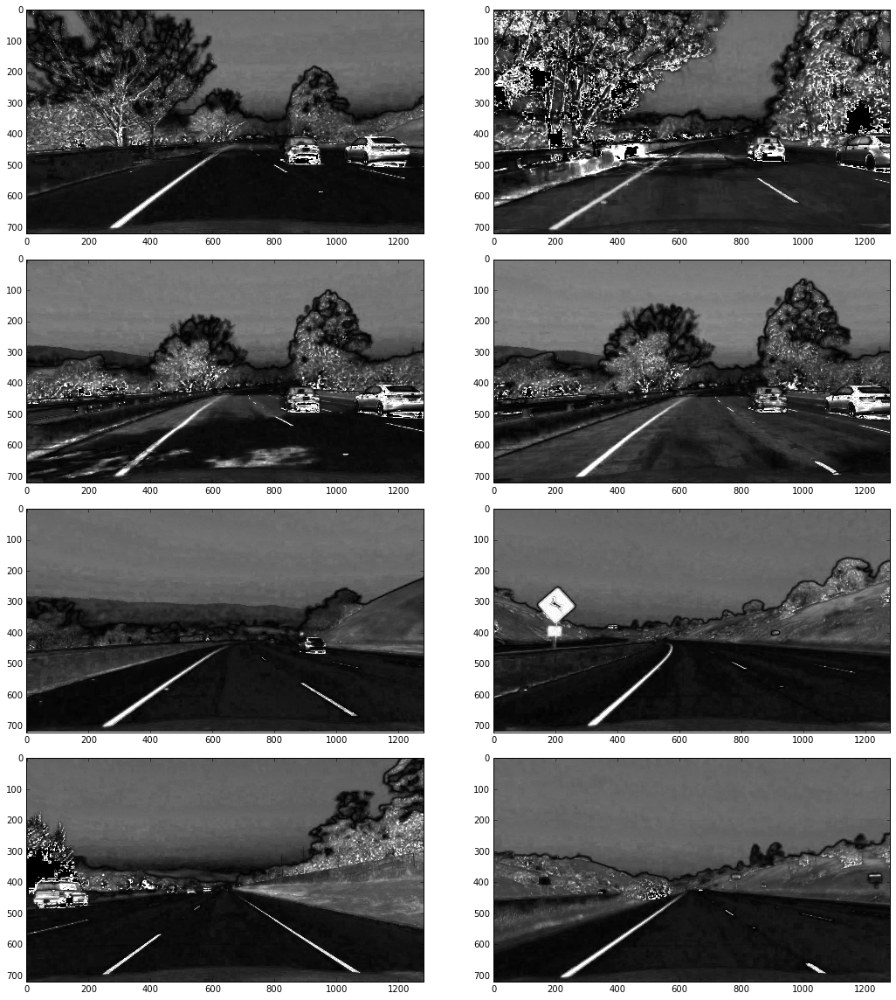

In [11]:
s_channles = [cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,2] for image in udst_imgs]
show_imgs(s_channles, fig_name='s_ch_imgs.png')

In [12]:
def s_ch_thresh(image, s_thresh=(0, 255)):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_ch = hls[:, :, 2]
    s_binary = np.zeros_like(s_ch)
    s_binary[(s_ch >= s_thresh[0]) & (s_ch < s_thresh[1])] = 1
    return s_binary

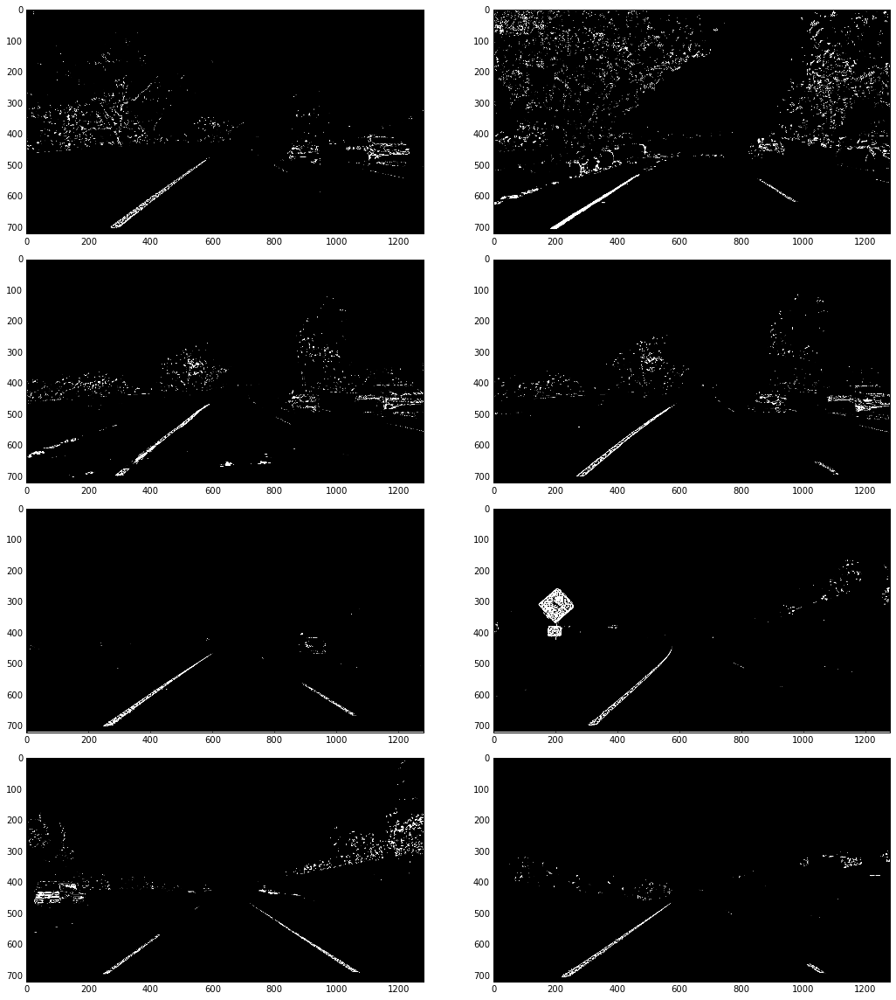

In [13]:
s_ch_thresh_imgs = [s_ch_thresh(image, s_thresh=(160, 255))for image in udst_imgs]
show_imgs(s_ch_thresh_imgs)

In [14]:
def v_ch_thresh(image, v_thresh=(0, 255)):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    v_ch = hls[:, :, 2]
    v_binary = np.zeros_like(v_ch)
    v_binary[(v_ch >= v_thresh[0]) & (v_ch < v_thresh[1])] = 1
    return v_binary

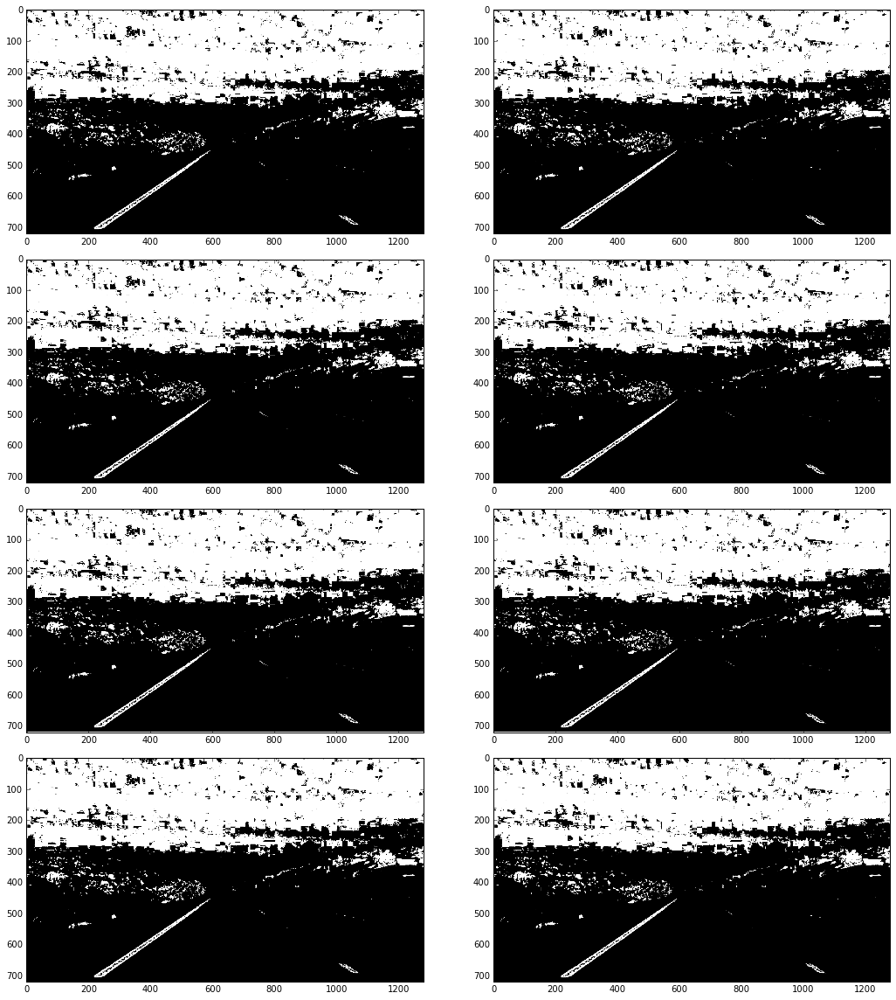

In [15]:
v_ch_thresh_imgs = [v_ch_thresh(image, v_thresh=(100, 255))for image in udst_imgs]
show_imgs(v_ch_thresh_imgs)

In [16]:
def color_thresh(image, s_thresh=(0, 255), v_thresh=(0, 255)):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    s_ch = hls[:, :, 2]
    s_binary = np.zeros_like(s_ch)
    v_ch = hsv[:, :, 2]
    v_binary = np.zeros_like(v_ch)

    s_binary[(s_ch >= s_thresh[0]) & (s_ch < s_thresh[1])] = 1
    v_binary[(v_ch >= v_thresh[0]) & (v_ch < v_thresh[1])] = 1

    result = np.zeros_like(s_binary)
    result[(s_binary == 1) & (v_binary) == 1] = 1
    return result

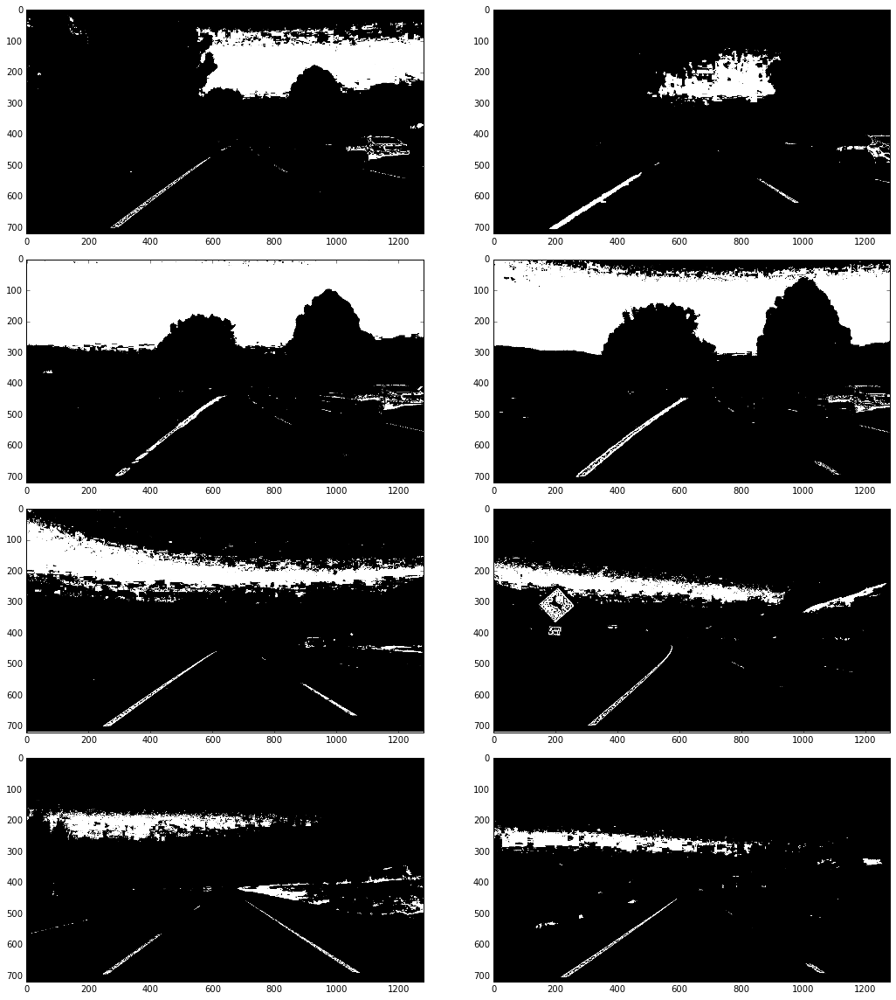

In [17]:
col_thersh_imgs = [color_thresh(image, s_thresh=(100, 255), v_thresh=(200, 255)) for image in udst_imgs]
show_imgs(col_thersh_imgs, cmap='gray', fig_name='sch_and_vch_thresh.png')

In [18]:
def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

In [19]:
def abs_sobel_thresh(gray_img, orient='x', kernel=3, thresh=(0, 255), output_abs_s=False):
    # take the derivative in 'x' or 'y' -> vertical or horizontal
    sobel = cv2.Sobel(gray_img, cv2.CV_64F, orient == 'x', orient == 'y', ksize=kernel)
    # take the absolute of derivative value
    abs_sobel = np.absolute(sobel)
    # scale to 8-bit (0-255) then covert to np.uint8
    scale_s = np.uint8(255 * abs_sobel / np.max(abs_sobel))

    grad_binary = np.zeros_like(scale_s)
    grad_binary[(scale_s >= thresh[0]) & (scale_s <= thresh[1])] = 1

    if output_abs_s == True:
        output = abs_sobel
    else:
        output = grad_binary
    return output

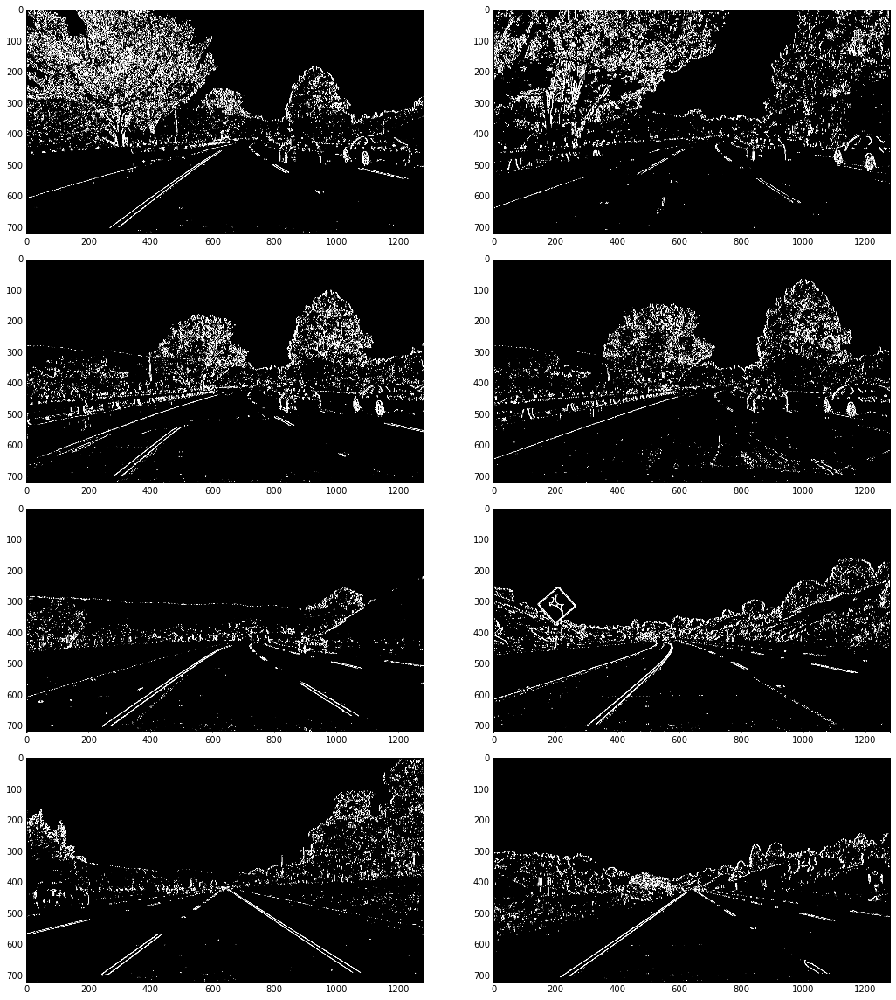

In [20]:
# convert image to binary with sobel x to detect vertical lines
sobelx_imgs = [abs_sobel_thresh(grayscale(image), thresh=(20, 255)) for image in udst_imgs]
show_imgs(sobelx_imgs, cmap='gray', fig_name='sobelx_binary.png')

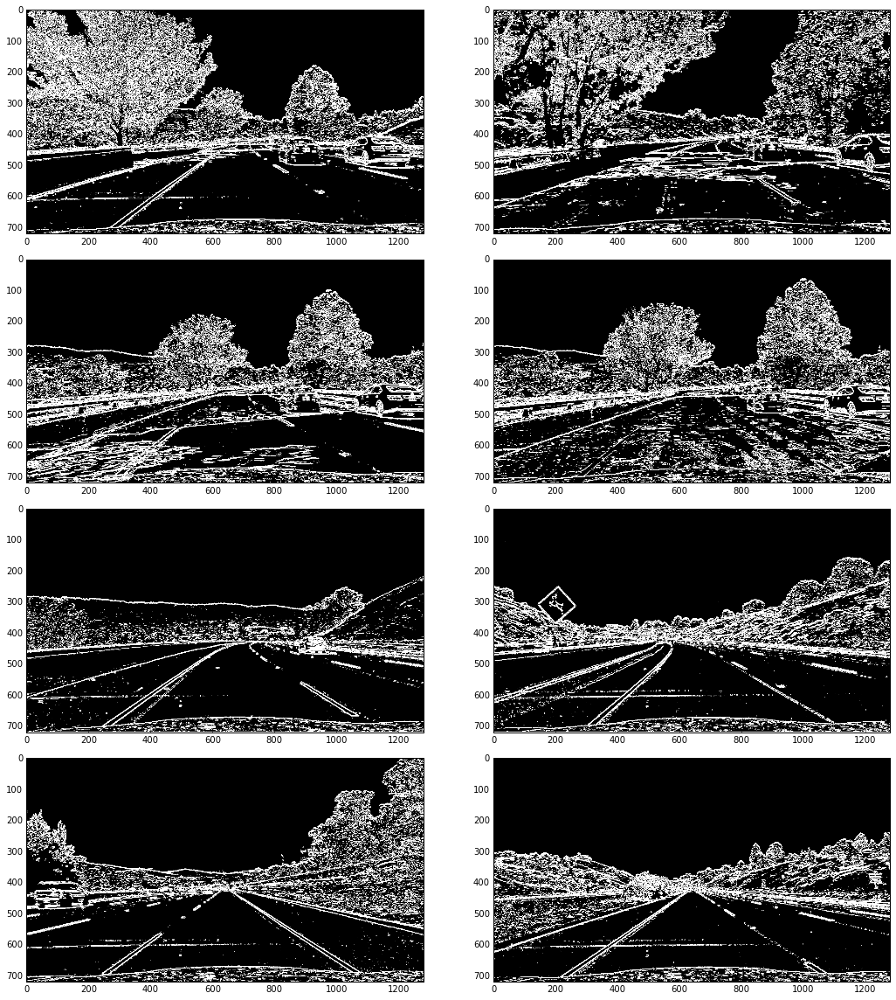

In [21]:
# convert image to binary with sobel y to detect horizontal lines
sobely_imgs = [abs_sobel_thresh(grayscale(image), thresh=(10, 255), orient='y') for image in udst_imgs]
show_imgs(sobely_imgs, cmap='gray', fig_name='sobely_binary.png')

In [22]:
def combine_img(img1, img2, cal='and'):
    output = np.zeros_like(img1)
    if cal == 'and':
        output[(img1==1)&(img2==1)]=1
    else:
        output[(img1==1)|(img2==1)]=1
    return output

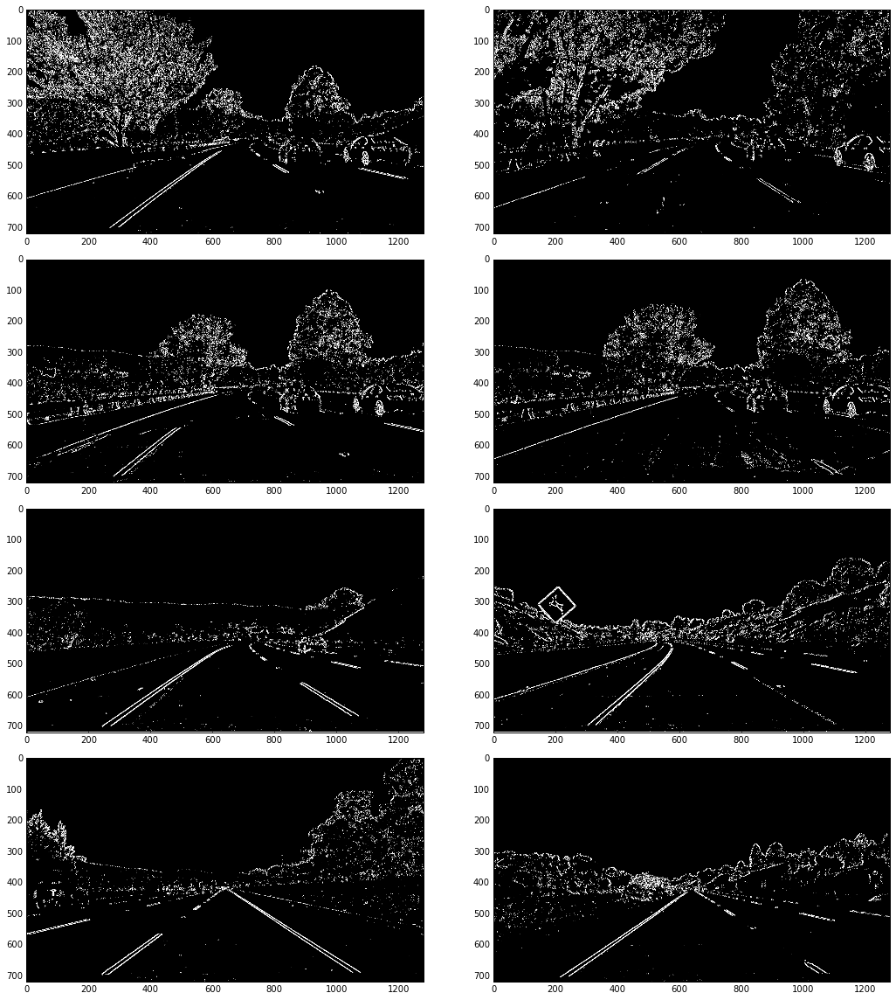

In [23]:
sobel_xy_imgs = [combine_img(sbx, sby) for sbx, sby in zip(sobelx_imgs, sobely_imgs)]
show_imgs(sobel_xy_imgs, cmap='gray', fig_name='combine_sx_sy_binary.png')

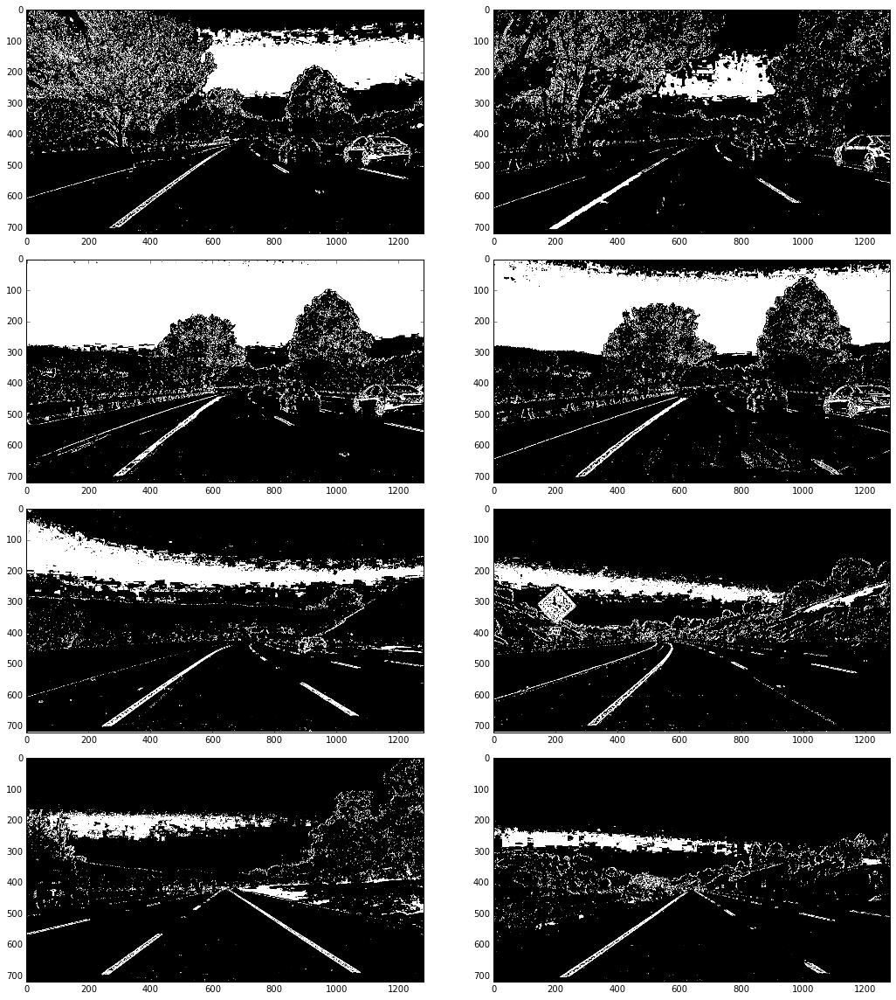

In [24]:
combine_imgs = [combine_img(sobelxy, col_img, cal='or') for sobelxy, col_img in zip(sobel_xy_imgs, col_thersh_imgs)]
show_imgs(combine_imgs, cmap='gray', fig_name='combine_sx_sy_color.png')

## Select ROI area

Here are the source points which we will used to warp test images

In [25]:
top_left = [597, 450]
botton_left = [279, 670]
top_right = [685, 450]
bottom_right = [1027,670]
x = [top_left[0], top_right[0], bottom_right[0], botton_left[0], top_left[0]]
y = [top_left[1], top_right[1], bottom_right[1], botton_left[1], top_left[1]]

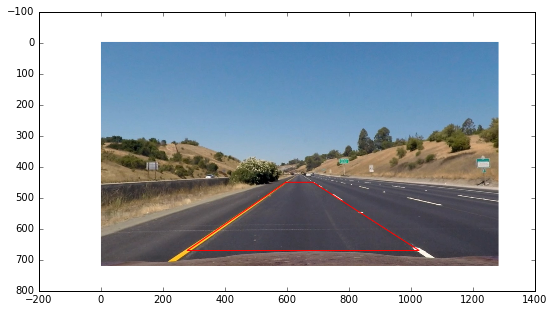

In [26]:
plt.figure(figsize=(10,5))
plt.imshow(udst_imgs[7])
plt.plot(x, y, 'r-', lw=1)
plt.savefig('./output_images/ROI_view.png')

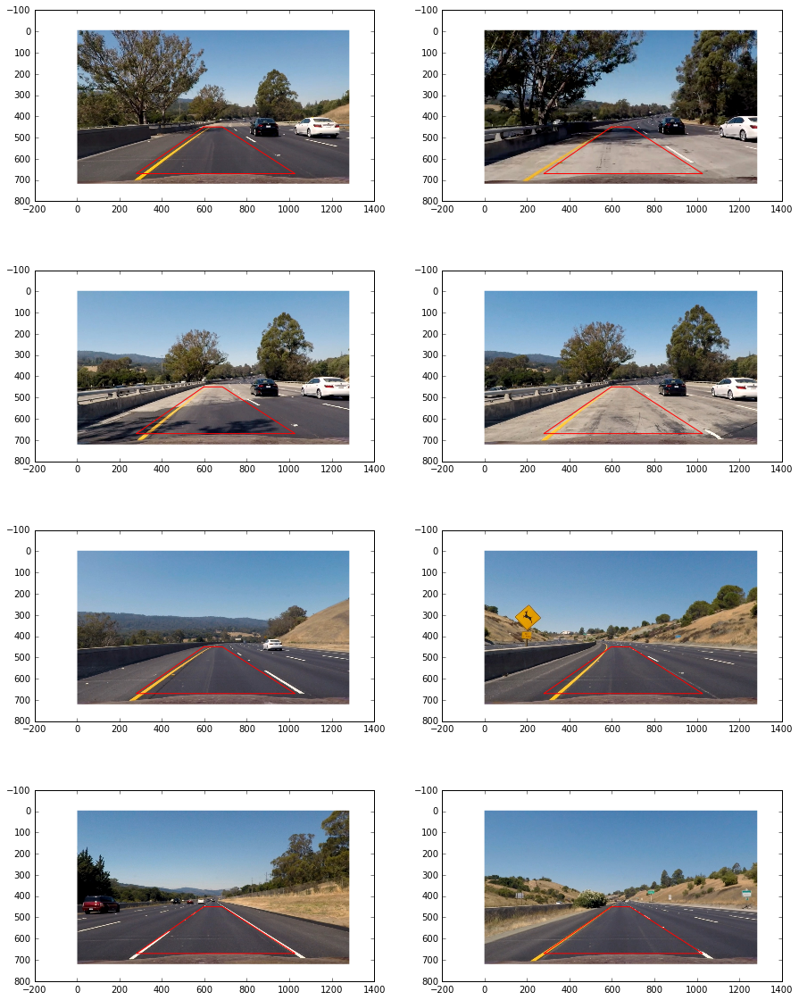

In [27]:
indices = np.arange(0, 8).reshape(4, 2)
fig, axis = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))
for r in range(4):
    for c in range(2):
        axis[r][c].imshow(udst_imgs[indices[r][c]])
        axis[r][c].plot(x, y, 'r-', lw=1)
plt.savefig('./output_images/ROI.png')

Compute the perspective transform, M, Minv given source and destination points.

In [28]:
src = np.float32([[597, 450], [685, 450], [1027,667], [279, 667]])
dst = np.float32([[320, 0],[960, 0],[960, 720],[320, 720]])

In [29]:
def warped_img(image, src, dst):
    img_size = (image.shape[1], image.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src) 
    warped = cv2.warpPerspective(image, M, img_size, flags = cv2.INTER_LINEAR) 
    return warped, Minv

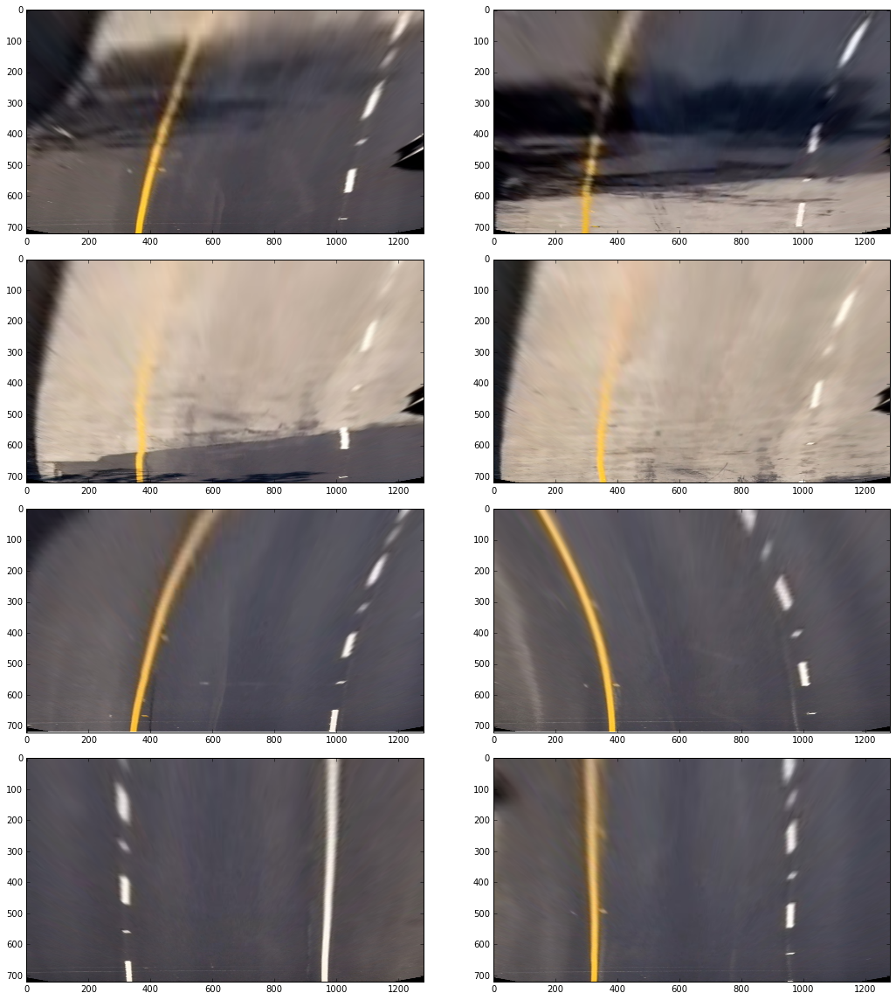

In [30]:
warped_rgb_results = [warped_img(image, src, dst) for image in udst_imgs]
warped_rgb_imgs = [warped_rgb_results[i][0] for i in range(len(warped_rgb_results))]
show_imgs(warped_rgb_imgs, fig_name='warped_rgb_imgs.png')

In [31]:
warped_results = [warped_img(image, src, dst) for image in combine_imgs]

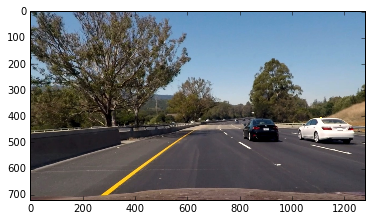

In [32]:
test_image = udst_imgs[0]
plt.imshow(test_image)

In [33]:
test_warped_img, Minv = warped_img(test_image, src, dst)

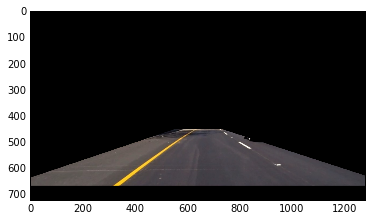

In [34]:
recover = cv2.warpPerspective(test_warped_img, Minv, (1280, 720), flags = cv2.INTER_LINEAR)
plt.imshow(recover)

Here are examples of applying a perspective transform to combined binary images.

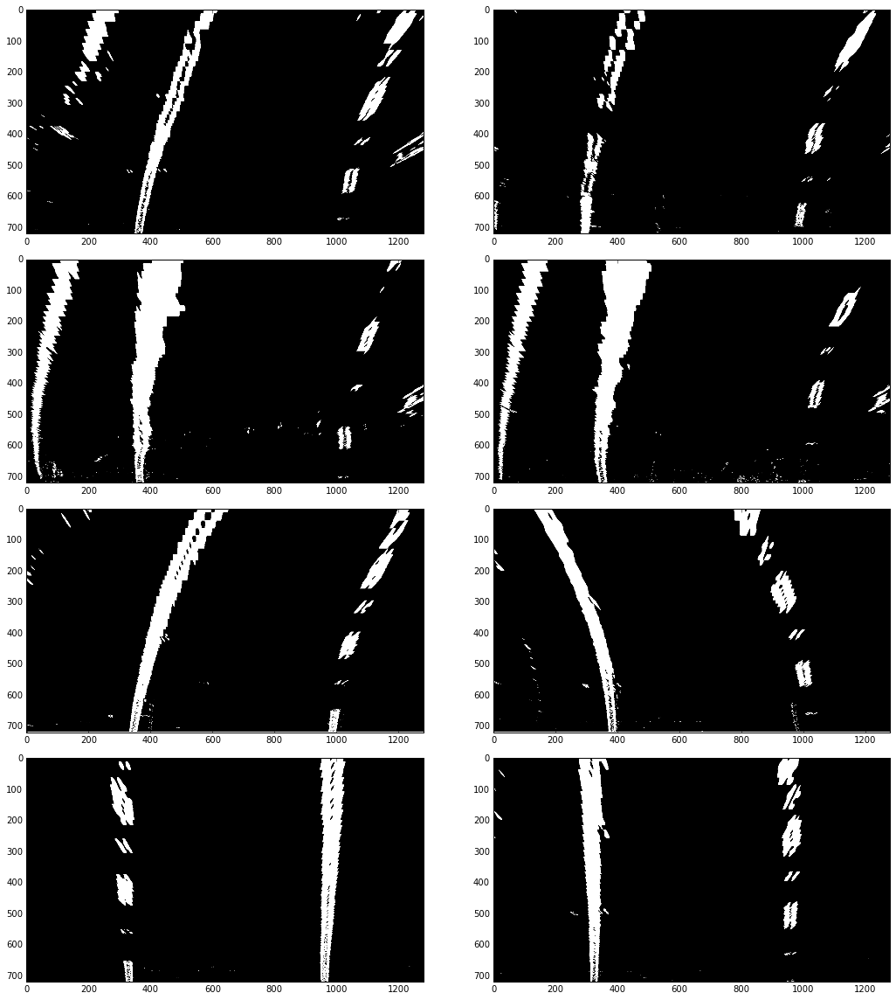

In [35]:
warped_imgs = [warped_results[i][0] for i in range(len(warped_results))]
show_imgs(warped_imgs, cmap='gray', fig_name='warped_binary.png')

## Detect lane pixels and fit to find the lane boundary.

### Peaks in a histogram

After applying calibration, thresholding and perspective transform to the images, then I take a histgram along al the columns in the low half of the images. Here are the histogram plots:

In [36]:
def histogram(img):
    histogram = np.sum(img[img.shape[0] // 2:, :], axis=0)
    return histogram

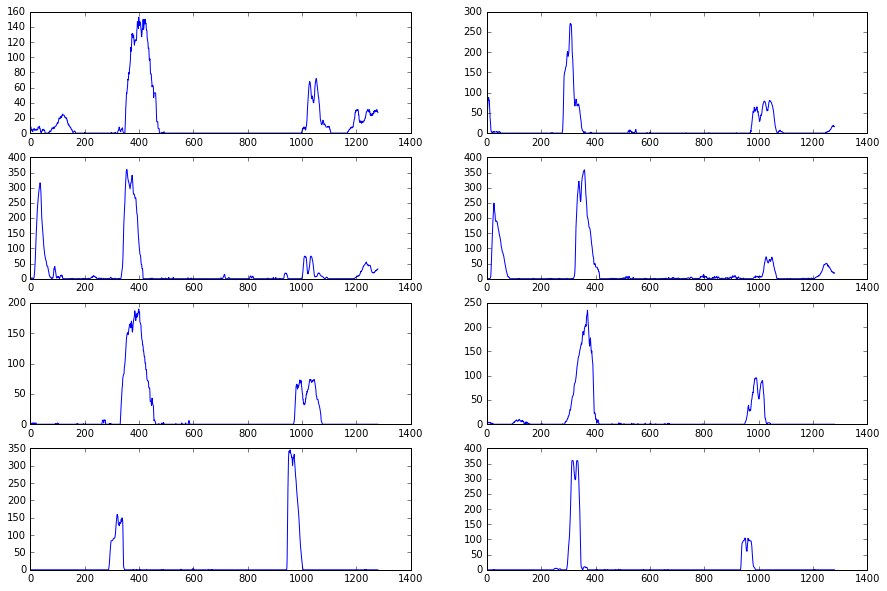

In [37]:
hist_datas = [histogram(image) for image in warped_imgs]
hist_idx = np.arange(0, 8).reshape(4, 2)
fig, axis = plt.subplots(nrows=4, ncols=2, figsize=(15, 10))
for r in range(4):
    for c in range(2):
        axis[r][c].plot(hist_datas[hist_idx[r][c]])
plt.savefig('./output_images/histogram.png')

In [38]:
def detected_window(warped):
    # Take warped image height and width
    img_height = warped.shape[0]
    img_width = warped.shape[1]
    # Take a histogram of the bottom half of the image
    histogram = np.sum(warped[img_height // 2:, :], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((warped, warped, warped)) * 255
    # Find the peak of the left and right halves of the histogram
    midpoint = np.int(img_width // 2)
    left_base = np.argmax(histogram[:midpoint])
    right_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # choose the number of slid windows
    nwindow = 9
    window_height = 80
    margin = 100
    minpix = 50
    
    # setting current point to update
    leftx_current = left_base
    rightx_current = right_base
    
    
    # x,y position of all nonzero pixels in the warped image
    nonzero = warped.nonzero()
    nonzerox = nonzero[1]
    nonzeroy = nonzero[0]
    
    # create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(nwindow):
        # window boundaries in x and y
        win_y_low = img_height - (window+1) * window_height
        win_y_high = img_height - window * window_height
        win_x_left_l = leftx_current - margin
        win_x_left_h = leftx_current + margin
        win_x_right_l = rightx_current - margin
        win_x_right_h = rightx_current + margin
        
        # Draw the window on the visualizaiton image
        # rectangle(img, pt1, pt2, color[, thickness[, lineType[, shift]]]) -> img
        cv2.rectangle(out_img, (win_x_left_l, win_y_low), (win_x_left_h, win_y_high), (0, 255, 0), 2)
        cv2.rectangle(out_img, (win_x_right_l, win_y_low), (win_x_right_h, win_y_high), (0, 255, 0), 2)
        
        detect_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &\
                         (nonzerox >= win_x_left_l) & (nonzerox < win_x_left_h)).nonzero()[0]
        detect_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &\
                             (nonzerox >= win_x_right_l) & (nonzerox < win_x_right_h)).nonzero()[0]
        left_lane_inds.append(detect_left_inds)
        right_lane_inds.append(detect_right_inds)
        
        # if detected line pixels > minpix, slide next window on their mean position
        if len(detect_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[detect_left_inds]))
        if len(detect_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[detect_right_inds]))
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    return out_img, (leftx, lefty), (rightx, righty)

In [39]:
def fit_pts(image, left_p, right_p):
    # Fit a second order polynomial to each
    left_fit = np.polyfit(left_p[1], left_p[0], 2)
    right_fit = np.polyfit(right_p[1], right_p[0], 2)
    
    ploty = np.arange(0, image.shape[0])
    left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

Here is the result of the warped image.

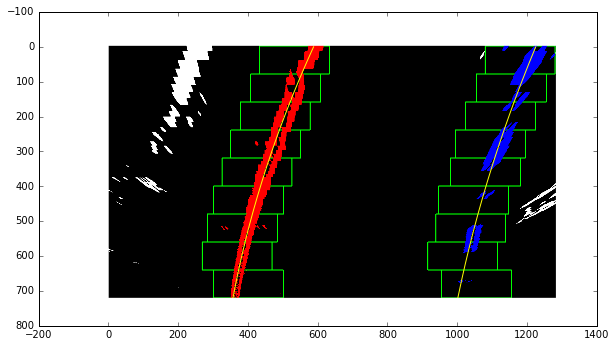

In [40]:
out_img, left_p, right_p = detected_window(warped_imgs[0])
left_fitx, right_fitx, ploty = fit_pts(out_img, left_p, right_p)
plt.figure(figsize=(10,10))
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')

## Determine the curvature of the lane and vehicle position with respect to center.

In [41]:
output_imgs=[]
left_pts = []
right_pts = []
for warped in warped_imgs:
    output, left_p, right_p = detected_window(warped)
    output_imgs.append(output)
    left_pts.append(left_p)
    right_pts.append(right_p)

In [42]:
def draw_curve(warped, left_p, right_p, Minv=Minv):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/640 # meters per pixel in x dimension
    
    # Create an image to draw the lines on
    color_warped = np.zeros_like(warped)
    
    left_fitx, right_fitx, ploty = fit_pts(image=warped, left_p=left_p, right_p=right_p)
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(left_p[1]*ym_per_pix, left_p[0]*xm_per_pix, 2)
    right_fit_cr = np.polyfit(right_p[1]*ym_per_pix, right_p[0]*xm_per_pix, 2)
    
    
    y_eval = np.max(ploty)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    
    
    # get the camera positon
    camera_center = (left_fitx[-1] + right_fitx[-1])/2
    
    center_diff = (camera_center - warped.shape[1]/2) * xm_per_pix
    
    side_pos= 'left'
    if center_diff <= 0:
        side_pos = 'right'
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warped, np.int_([pts]), (0,255, 0))
    result = cv2.addWeighted(warped, 1, color_warped, 0.4, 0)
    
    cv2.putText(result, 'Radius of Left Curvature = '+str(round(left_curverad,3))+'(m)',(50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,0),2)
    cv2.putText(result, 'Radius of Right Curvature = '+str(round(right_curverad,3))+'(m)',(50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,0),2)
    cv2.putText(result, 'Vehicle is '+str(abs(round(center_diff,3)))+'(m) '+side_pos+' of center', (50,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,0),2)
    
    
    return result
    

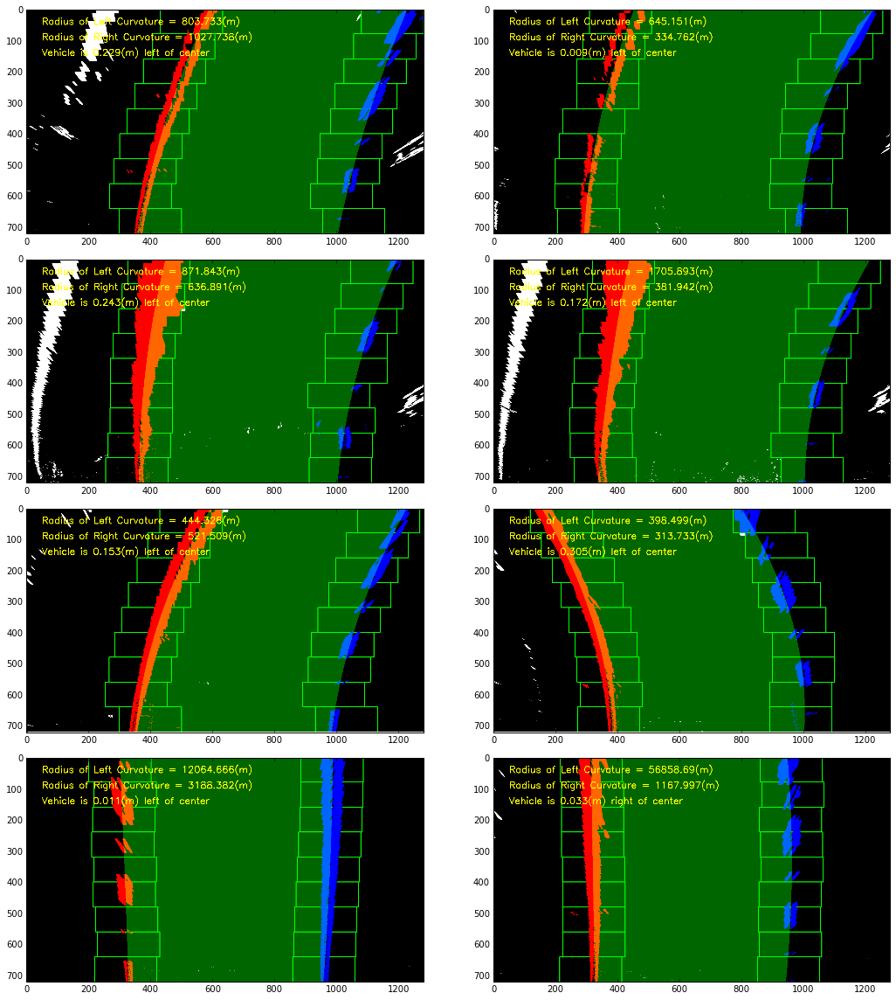

In [43]:
resulte_images = [draw_curve(warped, left_p, right_p) for warped, left_p, right_p in zip(output_imgs, left_pts, right_pts)]
show_imgs(resulte_images, fig_name='warped_plot.png')

## Warp the detected lane boundaries back onto the original image.

In [44]:
def recover_image(image, warped, left_p, right_p, Minv=Minv):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Create an image to draw the lines on
    color_warped = np.zeros_like(image)
    
    left_fitx, right_fitx, ploty = fit_pts(image=warped, left_p=left_p, right_p=right_p)
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(left_p[1]*ym_per_pix, left_p[0]*xm_per_pix, 2)
    right_fit_cr = np.polyfit(right_p[1]*ym_per_pix, right_p[0]*xm_per_pix, 2)
    
    
    y_eval = np.max(ploty)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    
    
    # get the camera positon
    camera_center = (left_fitx[-1] + right_fitx[-1])/2
    
    center_diff = (camera_center - warped.shape[1]/2) * xm_per_pix
    
    side_pos= 'left'
    if center_diff <= 0:
        side_pos = 'right'
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warped, np.int_([pts]), (0,255, 0))
    rec_color_warped = cv2.warpPerspective(color_warped, Minv, (image.shape[1], image.shape[0]))
    
    result = cv2.addWeighted(image, 1, rec_color_warped, 0.4, 0)
    
    cv2.putText(result, 'Radius of Left Curvature = '+str(round(left_curverad,3))+'(m)',(50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
    cv2.putText(result, 'Radius of Right Curvature = '+str(round(right_curverad,3))+'(m)',(50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
    cv2.putText(result, 'Vehicle is '+str(abs(round(center_diff,3)))+'(m) '+side_pos+' of center', (50,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
    
    return result

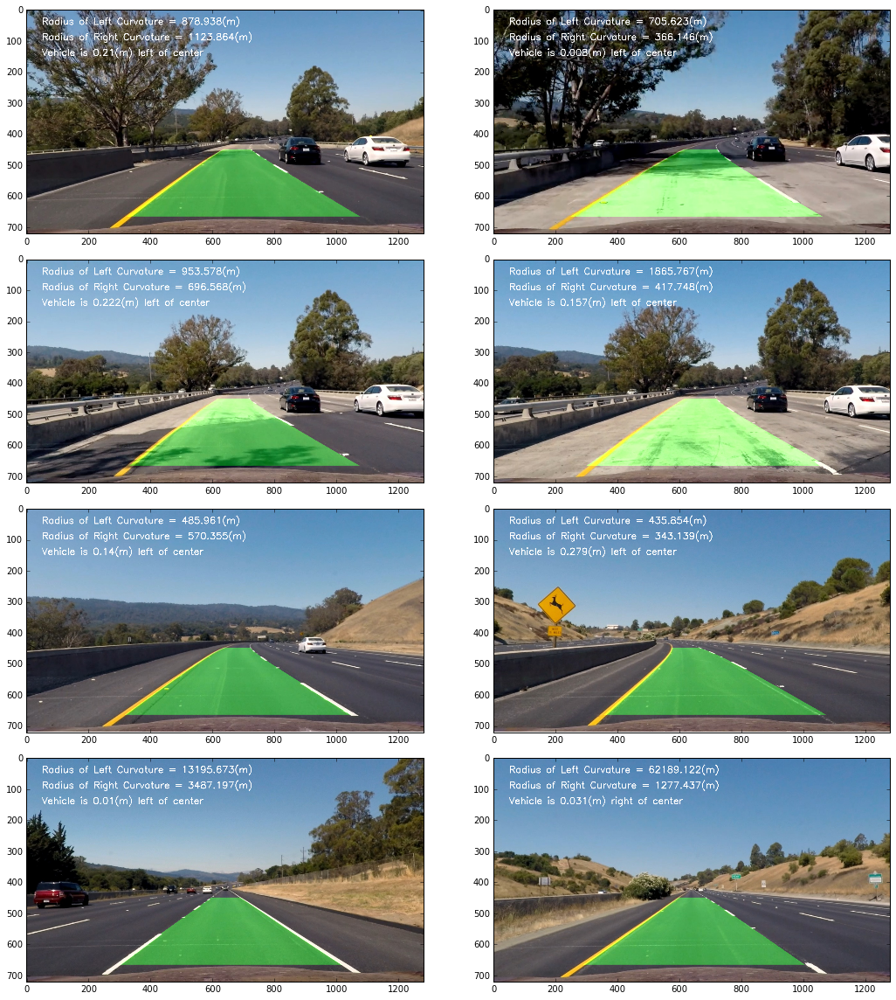

In [45]:
results = [recover_image(image, warped, left_p, right_p) for image, warped, left_p, right_p in zip(udst_imgs, warped_imgs, left_pts, right_pts)]
show_imgs(results, fig_name='recover_img.png')

## Apply functions on video pipline

Here are the main image process pipline fuction, which save in Img_process_func.py files

In [46]:
from collections import deque
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self, wid_height, margin, img_width, img_height, buf, max_count):
        self.window_height = win_height
        self.margin = margin
        
        self.image_width = img_width
        self.image_height = img_height
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = deque(maxlen=buf) 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = deque(maxlen=buf)
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = []#np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
        self.diff_fit = []
        
        # The number of undetected lane line times.
        self.count = 0
        self.max_count = max_count
        
        self.is_debug = False
        
        
        
        self.out_img = None
        self.binary_img = None
        
        self.reset_state = []
        
    
    def reset_detect_line(self, warped):
        debug = self.is_debug
        #print("Using reset_detect_line function!!!")
        # Take warped image height and width
        image_height = self.image_height
        image_width = self.image_width
        # choose the number of slid windows
        window_height = self.window_height
        
        midpoint = image_width//2
        
        nwindow = image_height // window_height
        margin = self.margin
        
        minpix = 50
        
        if self == Left:
            new_warped = warped[:, :midpoint]
        elif self == Right:
            new_warped = warped[:, midpoint:]

        # Take a histogram of the bottom half of the image
        histogram = np.sum(new_warped[img_height // 2:, :], axis=0)
        
    
        # ******************Debug*************************
        # Create an output image to draw on and  visualize the result
        if debug == True:
            half_img = np.dstack((new_warped, new_warped, new_warped)) * 255
        # ******************Debug*************************
        
        # Find the peak of the left and right halves of the histogram
        base_point = np.argmax(histogram)
        
        current_point = base_point
        
        # x,y position of all nonzero pixels in the warped image
        nonzero = new_warped.nonzero()
        nonzerox = nonzero[1]
        nonzeroy = nonzero[0]

        # create empty lists to receive left and right lane pixel indices
        lane_inds = []

        for window in range(nwindow):
            # window boundaries in x and y
            win_y_low = image_height - (window+1) * window_height
            win_y_high = image_height - window * window_height
            win_x_low = current_point - margin
            win_x_high = current_point + margin
            
            # ******************Debug*************************
            if debug == True:
                # Draw the window on the visualizaiton image
                # rectangle(img, pt1, pt2, color[, thickness[, lineType[, shift]]]) -> img
                cv2.rectangle(half_img, (win_x_low, win_y_low), (win_x_high, win_y_high), (0, 255, 0), 2)
            # ******************Debug*************************

            detect_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &\
                             (nonzerox >= win_x_low) & (nonzerox < win_x_high)).nonzero()[0]
            
            lane_inds.append(detect_inds)

            # if detected line pixels > minpix, slide next window on their mean position
            if len(detect_inds) > minpix:
                current_point = np.int(np.mean(nonzerox[detect_inds]))
                
        lane_inds = np.concatenate(lane_inds)
        ptx = nonzerox[lane_inds]
        pty = nonzeroy[lane_inds]
        
        # ******************Debug*************************
        if debug == True:
            if self == Left:
                half_img[pty, ptx] = [255, 0, 0]
            elif self == Right:
                half_img[pty, ptx] = [0, 0, 255]

            self.out_img = half_img
        # ******************Debug*************************

        self.allx = ptx
        self.ally = pty
        ploty = np.arange(0, image_height)
        
        if len(ptx) > 0:
            self.detected = True
            fit = np.polyfit(pty, ptx, 2)
            self.current_fit.append(fit)
            self.best_fit = fit
            
            fitx = fit[0] * ploty ** 2 + fit[1] * ploty + fit[2]
            self.recent_xfitted.append(fitx)
            self.bestx = fitx
        else:
            self.detected = False
    
    def detect_lane_line(self, warped):
        debug = self.is_debug
        #print("Using detect_lane_line function!!!")
        midpoint = self.image_width // 2
        image_height = self.image_height
        margin = self.margin
        ploty = np.arange(0, image_height)
        
        if self == Left:
            new_warped = warped[:, :midpoint]
        elif self == Right:
            new_warped = warped[:, midpoint:]
        
        # ******************Debug*************************
        if debug == True:
            half_img = np.dstack((new_warped, new_warped, new_warped)) * 255
        # ******************Debug*************************
        
        nonzero = new_warped.nonzero()
        nonzerox = nonzero[1]
        nonzeroy = nonzero[0]
        
        # load best_fit
        fit = self.best_fit
        
        # ******************Debug*************************
        if debug == True:
            window_img = np.zeros_like(half_img)
            line_window1 = np.array([np.transpose(np.vstack([self.recent_xfitted[-1] - margin, ploty]))])
            line_window2 = np.array([np.flipud(np.transpose(np.vstack([self.recent_xfitted[-1] + margin, ploty])))])
            line_pts = np.hstack((line_window1, line_window2))
        # ******************Debug*************************
        
        
        
        lane_inds = ((nonzerox > (fit[0] * nonzeroy ** 2 + fit[1] * nonzeroy + fit[2] - margin)) &\
                     (nonzerox < (fit[0] * nonzeroy ** 2 + fit[1] * nonzeroy + fit[2] + margin)))
        
        new_ptx = nonzerox[lane_inds]
        new_pty = nonzeroy[lane_inds]
        
        self.allx = new_ptx
        self.ally = new_pty
        
        # ******************Debug*************************
        if debug == True:
            if self == Left:
                half_img[new_pty, new_ptx] = [255, 0, 0]
            elif self == Right:
                half_img[new_pty, new_ptx] = [0, 0, 255]

            # Generate a polygon to illustrate the search window area
            # And recast the x and y points into usable format for cv2.fillPoly()
            cv2.fillPoly(window_img, np.int_([line_pts]), (0,255, 0))
            self.out_img = cv2.addWeighted(half_img, 1, window_img, 0.4, 0)
        # ******************Debug*************************
        
        
        
        if len(new_ptx) > 0:
            self.detected = True
            new_fit = np.polyfit(new_pty, new_ptx, 2)
            self.current_fit.append(new_fit)
            
            new_fitx = new_fit[0] * ploty ** 2 + new_fit[1] * ploty + new_fit[2]
            self.recent_xfitted.append(new_fitx)
        else:
            self.detected = False
            
        
    def curvature(self, ym_per_pix, xm_per_pix):
            
        # Create an image to draw the lines on
        #color_warped = np.zeros_like(warped)
            
        # Fit new polynomials to x,y in world space
        
        if self.detected == True:
            fit_cr = np.polyfit(self.ally * ym_per_pix, self.allx * xm_per_pix, 2)

            y_eval = self.image_height-1
            # Calculate the new radii of curvature
            curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])

            self.radius_of_curvature = curverad
        else:
            self.radius_of_curvature = None
        
    def reset_all(self):
        self.bestx = None
        self.best_fit = None
        #self.current_fit = []
        #self.recent_xfitted = []
        self.radius_of_curvature = None
        self.detected = False
        self.count = 0

In [47]:
img_width = 1280
img_height = 720
win_height = 80
margin = 100
buffer = 5
max_count = 5
src = np.float32([[597, 450], [685, 450], [1027,672], [279, 672]])
dst = np.float32([[320, 0],[960, 0],[960, 720],[320, 720]])
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/640 # meters per pixel in x dimension

In [48]:
def is_paralleled(left_fit, right_fit, thresh=(0.0006, 0.6)):
    if (Left.detected == True)&(Right.detected == True):
        diff_fit = np.absolute(left_fit - right_fit)
        return (diff_fit[0] < thresh[0]) and (diff_fit[1] <  thresh[1])
    else:
        return False

In [49]:
def is_max_count():
    if (Left.count < Left.max_count) & (Right.count < Right.max_count):
        Left.reset_state.append(0)
        Right.reset_state.append(0)
        #print('No')
    else:
        Left.reset_state.append(1)
        Right.reset_state.append(1)
        Left.reset_all()
        Right.reset_all()
        #print('Yes')

In [50]:
def camera_centriod():
    # camera postion
    if (Left.detected == False)|(Right.detected == False):
        center_diff = None
    else:
        carmera_center = (Left.bestx[-1] + (Right.bestx[-1] + img_width/2))/2
        center_diff = (carmera_center - img_width/2) * xm_per_pix
    return center_diff

In [51]:
def process_pipline(image, sx_thresh=(20, 255), sy_thresh=(10, 255), s_thresh=(100, 255), v_thresh=(200, 255), src=src, dst=dst):
    udst_image = img_pro.undistorte_img(image)
    gray = img_pro.grayscale(udst_image)
    sobelx = img_pro.abs_sobel_thresh(gray, thresh=sx_thresh)
    sobely = img_pro.abs_sobel_thresh(gray, orient='y', thresh=sy_thresh)
    sx_and_sy = img_pro.combine_img(img1=sobelx, img2=sobely)
    col_sel = img_pro.color_thresh(udst_image, s_thresh=s_thresh, v_thresh=v_thresh)
    col_sx_sy = img_pro.combine_img(img1=sx_and_sy, img2=col_sel, cal='or')
    warped, Minv = img_pro.warped_img(col_sx_sy, src=src, dst=dst)

    #Left.binary_img = col_sx_sy
    ploty = np.arange(0, img_height)
    # If Line.detected == False, turn on Line.reset_detect_line function, else turn on detect_line function
    if (Left.detected == False):
        # Left not detected, Right not detected
        if (Right.detected == False):
            Left.reset_detect_line(warped)
            Right.reset_detect_line(warped)
            is_paral = is_paralleled(Left.best_fit, Right.best_fit)
            if is_paral == True:
                Left.detected = True
                Right.detected = True
                Left.reset_state.append(0)
                Right.reset_state.append(0)
                # Left.curvature()
                # Right.curvature()

            else:
                Left.reset_all()
                Right.reset_all()
                Left.reset_state.append(1)
                Right.reset_state.append(1)
        # Left not detected, Right detected
        else:
            Left.current_fit.pop()
            Right.current_fit.pop()
            Left.recent_xfitted.pop()
            Right.recent_xfitted.pop()
            Left.detected = True

            Left.count += 1
            # if count > max_count reset detected
            is_max_count()

    else:
        # Left detected, Right detected
        if(Right.detected == True):
            Left.detect_lane_line(warped)
            Right.detect_lane_line(warped)

            left_test_fit = np.mean(Left.current_fit, axis=0)
            right_test_fit = np.mean(Right.current_fit, axis=0)

            is_paral = is_paralleled(left_test_fit, right_test_fit)

            if is_paral == True:
                Left.best_fit = left_test_fit
                Right.best_fit = right_test_fit

                Left.bestx = np.mean(Left.recent_xfitted, axis=0)
                Right.bestx = np.mean(Right.recent_xfitted, axis=0)

                Left.reset_state.append(0)
                Right.reset_state.append(0)
            else:
                Left.current_fit.pop()
                Right.current_fit.pop()
                Left.recent_xfitted.pop()
                Right.recent_xfitted.pop()

                Left.count += 1
                Right.count += 1
                is_max_count()
        # Left detected, right not detected
        else:
            eft.current_fit.pop()
            Right.current_fit.pop()
            Left.recent_xfitted.pop()
            Right.recent_xfitted.pop()
            Right.detected = True

            Right.count += 1
            is_max_count()

    

    color_warped = np.zeros_like(udst_image)
    
    
    if (Left.detected == False)|(Right.detected==False):
        result = udst_image
        cv2.putText(result, 'CAN NOT DETECT!', (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    else:
        # from Line.recent_xfitted get fitx
        left_fitx = Left.bestx
        right_fitx = Right.bestx + udst_image.shape[1] / 2

        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        '''if len(Left.current_fit) > 1:
            left_fit_diff = (Left.current_fit[-1] - Left.current_fit[-2])
            Left.diffs.append(left_fit_diff)
            right_fit_diff = (Right.current_fit[-1] - Right.current_fit[-2])
            Right.diffs.append(right_fit_diff)
            paralleled_test()'''
        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warped, np.int_([pts]), (0, 255, 0))
        rec_color_warped = cv2.warpPerspective(color_warped, Minv, (img_width, img_height))

        result = cv2.addWeighted(udst_image, 1, rec_color_warped, 0.4, 0)

        # def curvature(self, warped, ym_per_pix, xm_per_pix):
        Left.curvature(ym_per_pix, xm_per_pix)
        Right.curvature(ym_per_pix, xm_per_pix)
        left_curverad = Left.radius_of_curvature
        right_curverad = Right.radius_of_curvature
        
        cv2.putText(result, 'Radius of Left Curvature = ' + str(round(left_curverad, 3)) + '(m)', (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
        cv2.putText(result, 'Radius of Right Curvature = ' + str(round(right_curverad, 3)) + '(m)', (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    

    center_diff = camera_centriod()
    if center_diff == None:
        cv2.putText(result, 'Vehicle is No Datas', (50, 150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    else:    
        side_pos = 'left'
        if center_diff <= 0:
            side_pos = 'right'
        cv2.putText(result, 'Vehicle is ' + str(abs(round(center_diff, 3))) + '(m) ' + side_pos + ' of center', (50, 150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    
    

    

    return result




In [52]:
debug_images = [test_images[0], test_images[2], test_images[3], test_images[1]] 

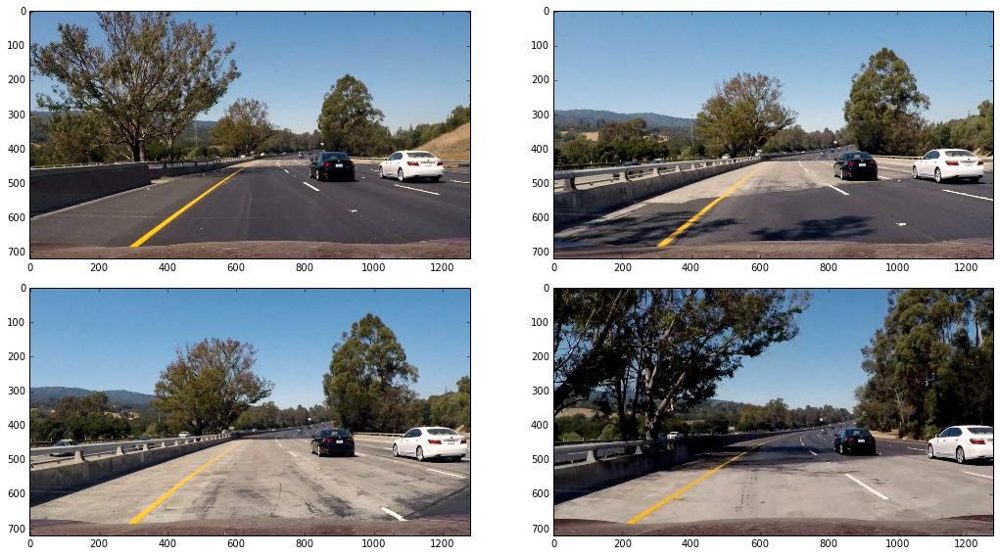

In [53]:
show_imgs(debug_images)

In [54]:
Left = Line(wid_height=win_height, margin=margin, img_width=img_width, img_height=img_height, buf=buffer, max_count=max_count)
Right = Line(wid_height=win_height, margin=margin, img_width=img_width, img_height=img_height, buf=buffer, max_count=max_count)

In [55]:
Left.is_debug = Right.is_debug = True

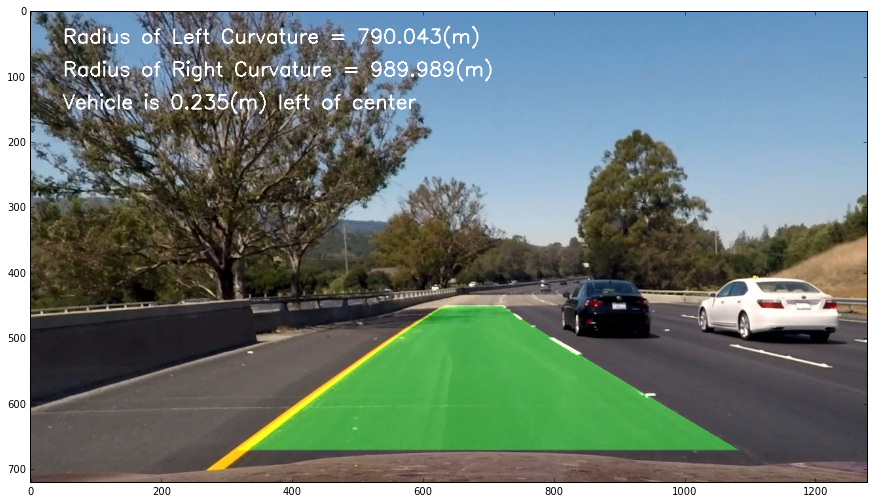

In [56]:
i=0
result = process_pipline(debug_images[i])
plt.figure(figsize=(15,15))
plt.imshow(result)

In [57]:
def video1_pipline(image):
    return process_pipline(image) 

In [58]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [59]:
#test_pro_imgs = [test_images[0],test_images[2],test_images[3],test_images[1]]
Left = Line(wid_height=win_height, margin=margin, img_width=img_width, img_height=img_height, buf=buffer, max_count=max_count)
Right = Line(wid_height=win_height, margin=margin, img_width=img_width, img_height=img_height, buf=buffer, max_count=max_count)
test_output = './output_project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip = VideoFileClip('./project_video.mp4')
test_clip = clip.fl_image(video1_pipline) #NOTE: this function expects color images!!
%time test_clip.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video ./output_project_video.mp4
[MoviePy] Writing video ./output_project_video.mp4


100%|█████████▉| 1260/1261 [02:28<00:00,  8.82it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_project_video.mp4 

CPU times: user 10min 1s, sys: 46.6 s, total: 10min 48s
Wall time: 2min 29s


In [60]:
def YV_color_thresh_or(image, y_thresh = (0, 255), v_thresh = (0, 255)):
    yuv = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
    Y = yuv[:, :, 0]
    V = yuv[:, :, 2]

    Y_binary = np.zeros_like(Y)
    Y_binary[(Y >= y_thresh[0]) & (Y <= y_thresh[1])] = 1

    V_binary = np.zeros_like(V)
    V_binary[(V >= v_thresh[0]) & (V <= v_thresh[1])] = 1
    combined = np.zeros_like(Y)
    combined[(Y_binary == 1) | (V_binary == 1)] = 1
    return combined

In [61]:
def color_thresh_or(image, s_thresh=(0, 255), v_thresh=(0, 255)):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    s_ch = hls[:, :, 2]
    s_binary = np.zeros_like(s_ch)
    v_ch = hsv[:, :, 2]
    v_binary = np.zeros_like(v_ch)

    s_binary[(s_ch >= s_thresh[0]) & (s_ch < s_thresh[1])] = 1
    v_binary[(v_ch >= v_thresh[0]) & (v_ch < v_thresh[1])] = 1

    result = np.zeros_like(s_binary)
    result[(s_binary == 1) | (v_binary) == 1] = 1
    return result

In [62]:
src2 = np.float32([[628, 450], [681, 450], [1052,690], [340, 690]])
dst2 = np.float32([[320, 0],[960, 0],[960, 720],[320, 720]])

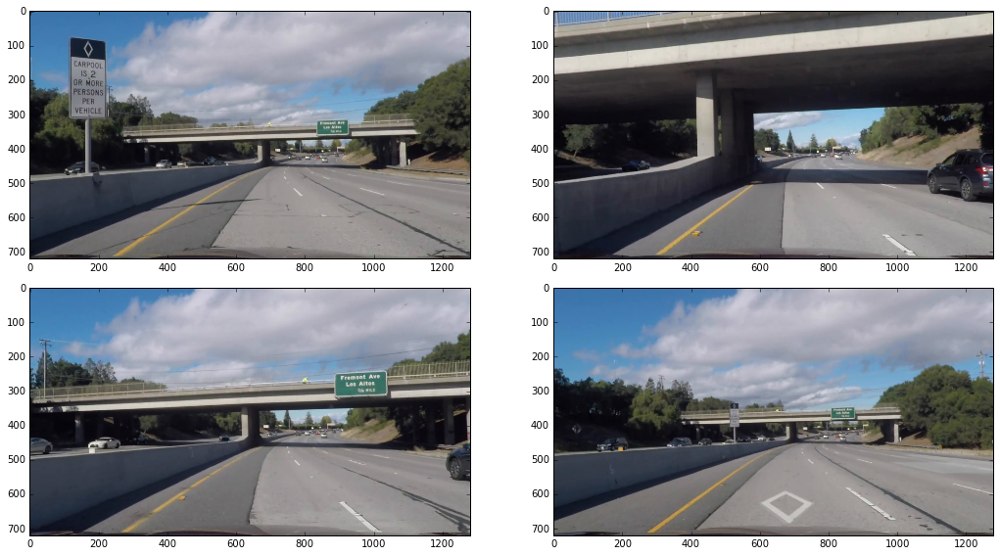

In [63]:
challenge_images_path = glob.glob('./challenge_test_images/*.jpg')
challenge_images = [mpimg.imread(path)for path in challenge_images_path]
challenge_udst_images = [undistorte_img(image) for image in challenge_images]
show_imgs(challenge_udst_images)

In [64]:
yv_thresh_imgs = [YV_color_thresh_or(image, v_thresh=(0, 120), y_thresh=(180, 255)) for image in challenge_udst_images]

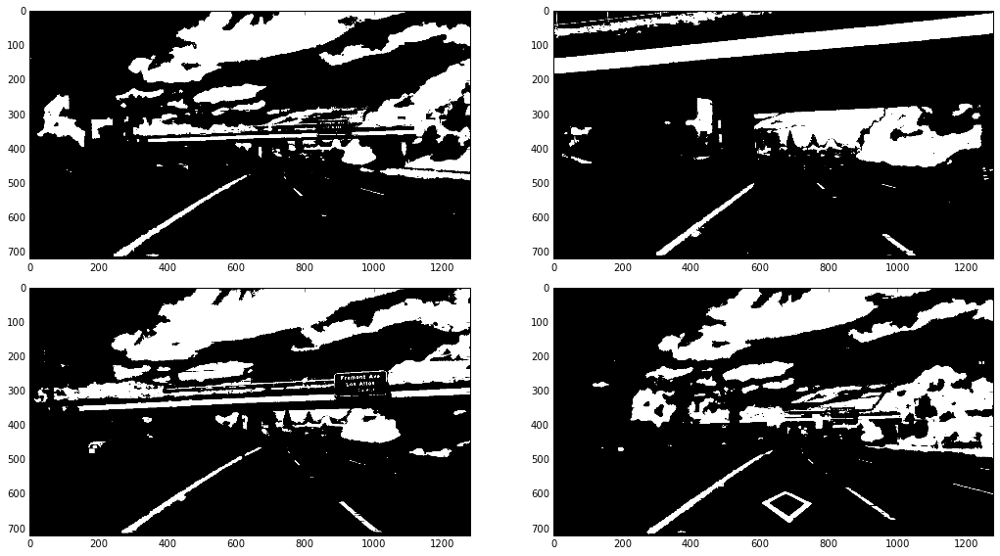

In [65]:
show_imgs(yv_thresh_imgs, fig_name='yv_channel_thresh.png')

Thank you very much for my Reviewer to give me some good Suggestions. Those suggestions work well in challenge_video, but have a little problem on parameters or thresholds(Maybe 😂). I will try again after I finish P5. 

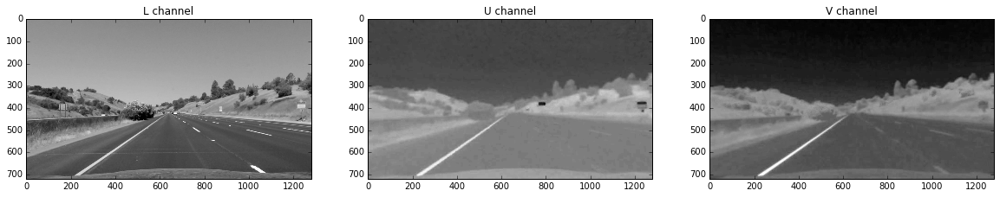

In [81]:
luv = cv2.cvtColor(udst_imgs[7], cv2.COLOR_RGB2LUV)
l_ch = luv[:,:,0]
u_ch = luv[:,:,1]
v_ch = luv[:,:,2]
fig, axis = plt.subplots(nrows=1, ncols=3, figsize=(20,5))
axis[0].imshow(l_ch, cmap='gray')
axis[0].set_title('L channel')
axis[1].imshow(u_ch, cmap='gray')
axis[1].set_title('U channel')
axis[2].imshow(v_ch, cmap='gray')
axis[2].set_title('V channel')
plt.savefig('./output_images/' + 'LUV_channel.png')

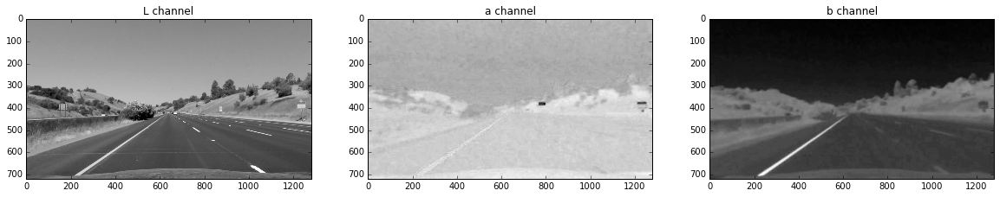

In [82]:
Lab = cv2.cvtColor(udst_imgs[7], cv2.COLOR_RGB2Lab)
l_ch = Lab[:,:,0]
a_ch = Lab[:,:,1]
b_ch = Lab[:,:,2]
fig, axis = plt.subplots(nrows=1, ncols=3, figsize=(20,5))
axis[0].imshow(l_ch, cmap='gray')
axis[0].set_title('L channel')
axis[1].imshow(a_ch, cmap='gray')
axis[1].set_title('a channel')
axis[2].imshow(b_ch, cmap='gray')
axis[2].set_title('b channel')
plt.savefig('./output_images/' + 'Lab_channel.png')

In [83]:
def L_thresh(image, thresh=(0, 255)):
    luv = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
    l_ch = luv[:,:,0]
    l_binary = np.zeros_like(l_ch)
    l_binary[(l_ch >= thresh[0])&(l_ch < thresh[1])] = 1
    return l_binary

In [84]:
def b_thresh(image, thresh=(0, 255)):
    Lab = cv2.cvtColor(image, cv2.COLOR_RGB2Lab)
    b_ch = Lab[:,:,2]
    b_binary = np.zeros_like(b_ch)
    b_binary[(b_ch >= thresh[0])&(b_ch < thresh[1])]=1
    return b_binary

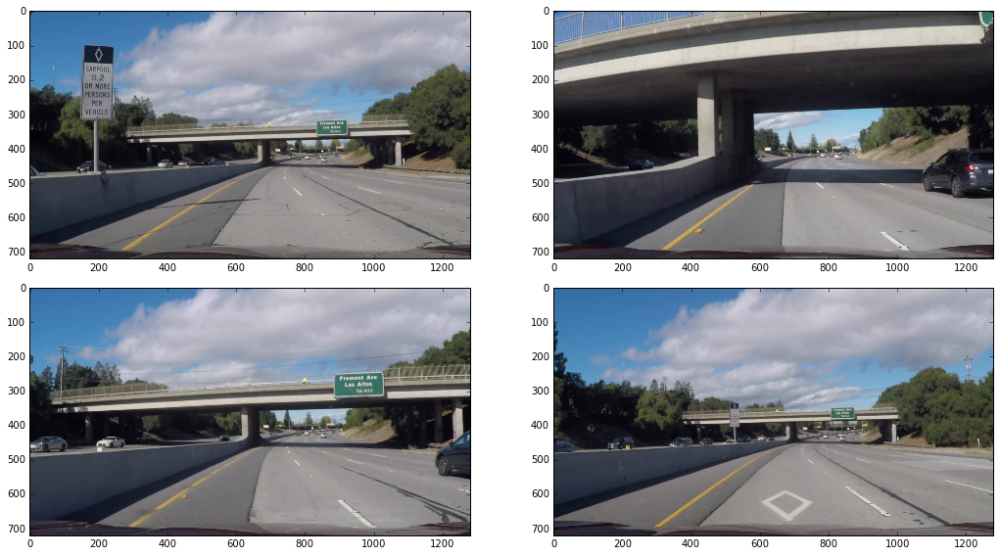

In [85]:
show_imgs(challenge_images)

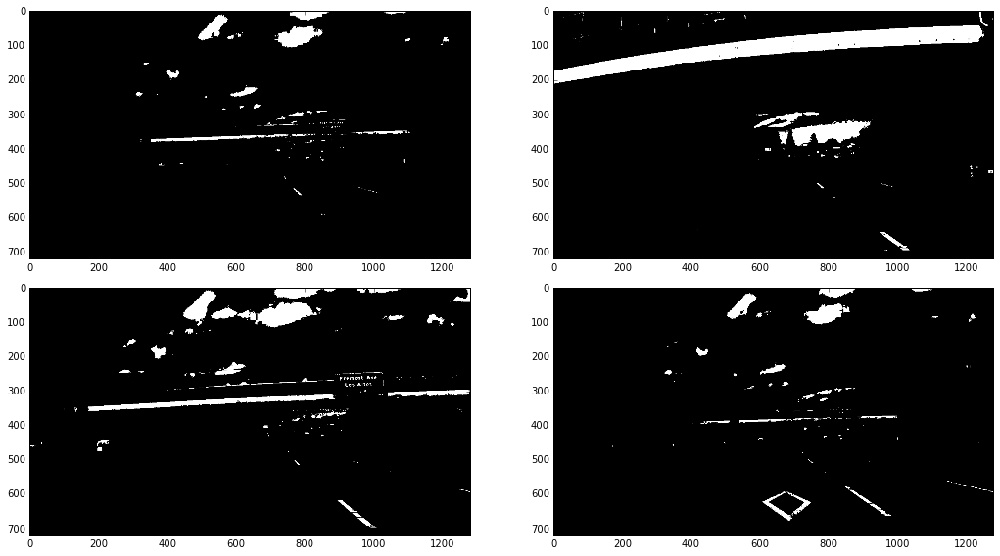

In [86]:
L_thresh_imgs = [L_thresh(image, thresh=(200, 255)) for image in challenge_images]
show_imgs(L_thresh_imgs)

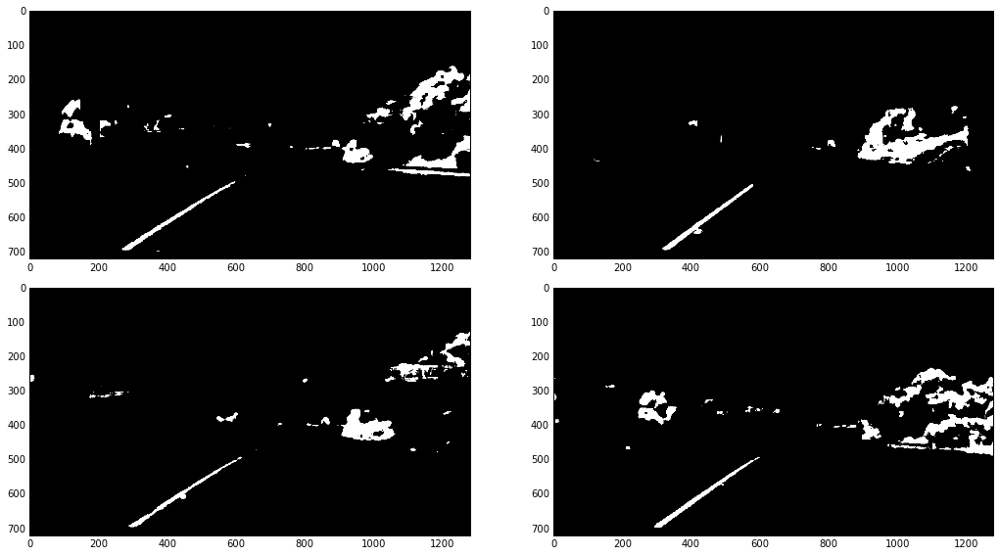

In [87]:
b_thresh_imgs = [b_thresh(image, thresh=(140, 255)) for image in challenge_images]
show_imgs(b_thresh_imgs)

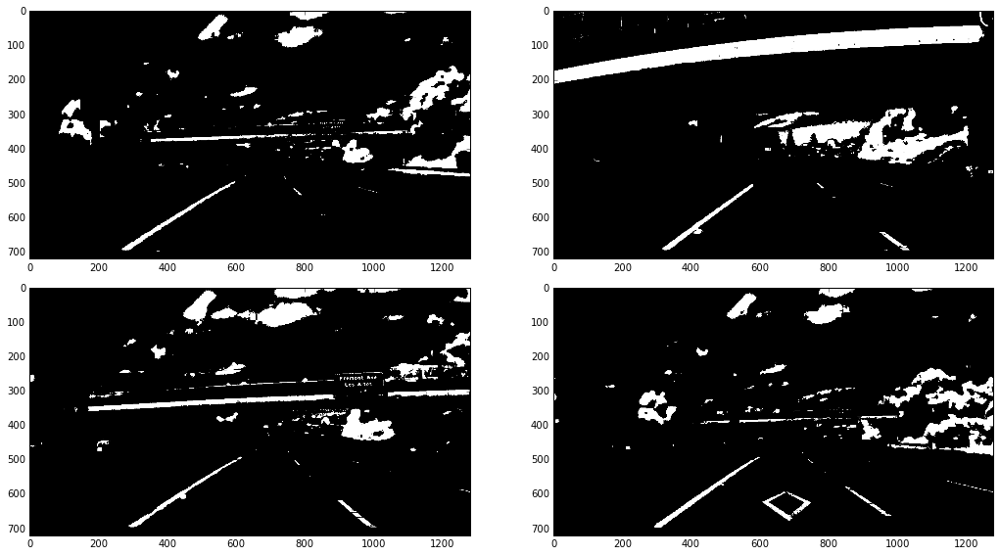

In [88]:
combine_L_b_imgs = [img_pro.combine_img(L_img, b_img, cal='or') for L_img, b_img in zip(L_thresh_imgs, b_thresh_imgs)]
show_imgs(combine_L_b_imgs)

In [89]:
src2 = np.float32([[628, 450], [681, 450], [1052,690], [340, 690]])
dst2 = np.float32([[320, 0],[960, 0],[960, 720],[320, 720]])

In [90]:
def process_pipline2(image, sx_thresh=(20, 255), sy_thresh=(10, 255), s_thresh=(100, 255), v_thresh=(200, 255), src=src, dst=dst):
    udst_image = img_pro.undistorte_img(image)
    gray = img_pro.grayscale(udst_image)
    sobelx = img_pro.abs_sobel_thresh(gray, thresh=sx_thresh)
    sobely = img_pro.abs_sobel_thresh(gray, orient='y', thresh=sy_thresh)
    sx_and_sy = img_pro.combine_img(img1=sobelx, img2=sobely)
    #col_sel = img_pro.color_thresh(udst_image, s_thresh=s_thresh, v_thresh=v_thresh)
    L_thresh_img = L_thresh(udst_image, thresh=(200, 255))
    b_thresh_img = b_thresh(udst_image, thresh=(140, 200))
    col_sel = img_pro.combine_img(L_thresh_img, b_thresh_img, cal='or')
    #col_sx_sy = img_pro.combine_img(img1=sx_and_sy, img2=col_sel, cal='or')
    warped, Minv = img_pro.warped_img(col_sel, src=src, dst=dst)
    
    #Left.binary_img = col_sx_sy
    ploty = np.arange(0, img_height)
    # If Line.detected == False, turn on Line.reset_detect_line function, else turn on detect_line function
    if (Left.detected == False):
        # Left not detected, Right not detected
        if (Right.detected == False):
            Left.reset_detect_line(warped)
            Right.reset_detect_line(warped)
            is_paral = is_paralleled(Left.best_fit, Right.best_fit, thresh=(0.001, 5))
            if is_paral == True:
                Left.detected = True
                Right.detected = True
                Left.reset_state.append(0)
                Right.reset_state.append(0)
                # Left.curvature()
                # Right.curvature()

            else:
                Left.reset_all()
                Right.reset_all()
                Left.reset_state.append(1)
                Right.reset_state.append(1)
        # Left not detected, Right detected
        else:
            Left.current_fit.pop()
            Right.current_fit.pop()
            Left.recent_xfitted.pop()
            Right.recent_xfitted.pop()
            Left.detected = True

            Left.count += 1
            # if count > max_count reset detected
            is_max_count()

    else:
        # Left detected, Right detected
        if(Right.detected == True):
            Left.detect_lane_line(warped)
            Right.detect_lane_line(warped)

            left_test_fit = np.mean(Left.current_fit, axis=0)
            right_test_fit = np.mean(Right.current_fit, axis=0)

            is_paral = is_paralleled(left_test_fit, right_test_fit)

            if is_paral == True:
                Left.best_fit = left_test_fit
                Right.best_fit = right_test_fit

                Left.bestx = np.mean(Left.recent_xfitted, axis=0)
                Right.bestx = np.mean(Right.recent_xfitted, axis=0)

                Left.reset_state.append(0)
                Right.reset_state.append(0)
            else:
                Left.current_fit.pop()
                Right.current_fit.pop()
                Left.recent_xfitted.pop()
                Right.recent_xfitted.pop()

                Left.count += 1
                Right.count += 1
                is_max_count()
        # Left detected, right not detected
        else:
            Left.current_fit.pop()
            Right.current_fit.pop()
            Left.recent_xfitted.pop()
            Right.recent_xfitted.pop()
            Right.detected = True

            Right.count += 1
            is_max_count()

    

    color_warped = np.zeros_like(udst_image)
    
    
    if (Left.detected == False)|(Right.detected==False):
        result = udst_image
        cv2.putText(result, 'CAN NOT DETECT!', (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    else:
        # from Line.recent_xfitted get fitx
        left_fitx = Left.bestx
        right_fitx = Right.bestx + udst_image.shape[1] / 2

        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        '''if len(Left.current_fit) > 1:
            left_fit_diff = (Left.current_fit[-1] - Left.current_fit[-2])
            Left.diffs.append(left_fit_diff)
            right_fit_diff = (Right.current_fit[-1] - Right.current_fit[-2])
            Right.diffs.append(right_fit_diff)
            paralleled_test()'''
        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warped, np.int_([pts]), (0, 255, 0))
        rec_color_warped = cv2.warpPerspective(color_warped, Minv, (img_width, img_height))

        result = cv2.addWeighted(udst_image, 1, rec_color_warped, 0.4, 0)

        # def curvature(self, warped, ym_per_pix, xm_per_pix):
        Left.curvature(ym_per_pix, xm_per_pix)
        Right.curvature(ym_per_pix, xm_per_pix)
        left_curverad = Left.radius_of_curvature
        right_curverad = Right.radius_of_curvature
        
        cv2.putText(result, 'Radius of Left Curvature = ' + str(round(left_curverad, 3)) + '(m)', (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
        cv2.putText(result, 'Radius of Right Curvature = ' + str(round(right_curverad, 3)) + '(m)', (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    

    center_diff = camera_centriod()
    if center_diff == None:
        cv2.putText(result, 'Vehicle is No Datas', (50, 150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    else:    
        side_pos = 'left'
        if center_diff <= 0:
            side_pos = 'right'
        cv2.putText(result, 'Vehicle is ' + str(abs(round(center_diff, 3))) + '(m) ' + side_pos + ' of center', (50, 150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    
    

    

    return result





In [91]:
Left = Line(wid_height=win_height, margin=margin, img_width=img_width, img_height=img_height, buf=buffer, max_count=max_count)
Right = Line(wid_height=win_height, margin=margin, img_width=img_width, img_height=img_height, buf=buffer, max_count=max_count)

In [92]:
Left.is_debug = Right.is_debug = True

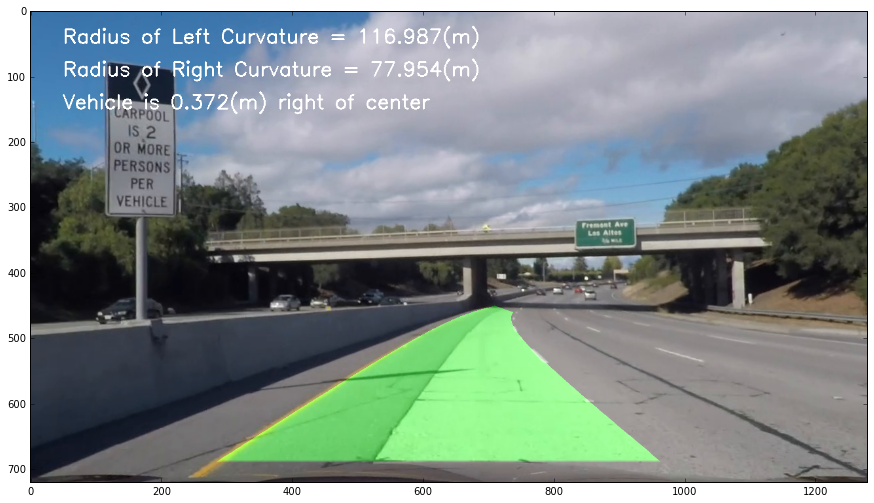

In [93]:
result = process_pipline2(challenge_images[0], src=src2, dst=dst2)
plt.figure(figsize=(15,15))
plt.imshow(result)

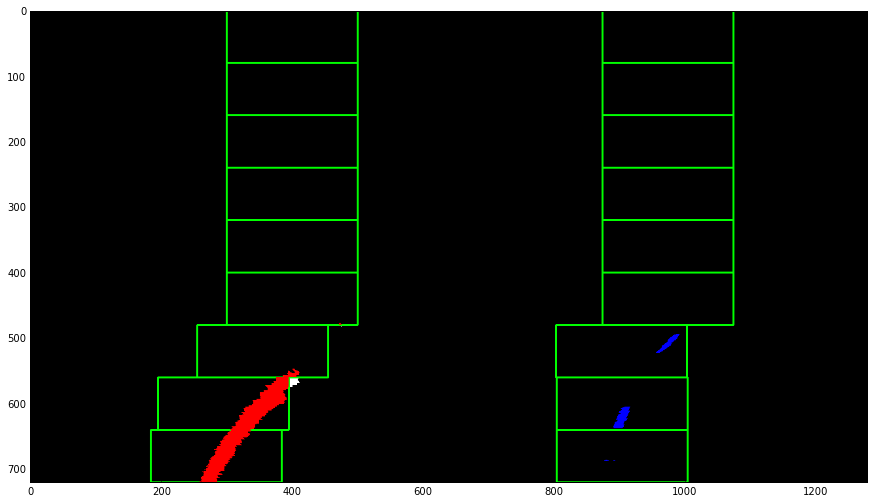

In [94]:
ploty = np.arange(0, 720)
plt.figure(figsize=(15,15))
plt.imshow(np.concatenate((Left.out_img,Right.out_img), axis=1))
#plt.plot(Left.bestx, ploty, color='yellow', lw=2)
#plt.plot(Left.recent_xfitted[-1], ploty, color='white', lw=2)

In [95]:
#test_pro_imgs = [test_images[0],test_images[2],test_images[3],test_images[1]]
Left = Line(wid_height=win_height, margin=margin, img_width=img_width, img_height=img_height, buf=buffer, max_count=max_count)
Right = Line(wid_height=win_height, margin=margin, img_width=img_width, img_height=img_height, buf=buffer, max_count=max_count)
test_output = './output_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip = VideoFileClip('./challenge_video.mp4')
test_clip = clip.fl_image(process_pipline2) #NOTE: this function expects color images!!
%time test_clip.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video ./output_challenge_video.mp4
[MoviePy] Writing video ./output_challenge_video.mp4


100%|██████████| 485/485 [00:56<00:00,  9.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_challenge_video.mp4 

CPU times: user 3min 51s, sys: 20.4 s, total: 4min 11s
Wall time: 56.9 s
